In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline 

import sys
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE

sys.path.append('..')
from env_config import DATA_PATH
from utils import *
from data import *
from plotting import *
from evaluation import *

In [3]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 100

sns.set(style='ticks')
sns.set_palette('cubehelix')

# Read and prepare data

In [4]:
kids = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.cols.fits'),
                           columns=['ID', 'MAG_GAAP_r', 'CLASS_STAR'])
print(kids.shape)

(100350873, 3)


In [5]:
kids_x_sdss = process_kids(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.SDSS.DR14.fits'), sdss_cleaning=True,
                           columns=COLUMNS_KIDS_ALL+COLUMNS_SDSS)

Data shape: (152244, 52)
Droping NANs: 130777 (85.90%) left


/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Cleaning SDSS: 124026 left


In [6]:
ctlg_clf = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_xgb_f-all__2019-10-08_12:31:16.csv'))
ctlg_z_qso = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_f-all_spec-qso__2019-10-08_13:12:05.csv'))
ctlg_z_galaxy = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_f-all_spec-galaxy__2019-10-08_14:59:04.csv'))

catalog = merge_specialized_catalogs(ctlg_clf, ctlg_z_qso, ctlg_z_galaxy)
print(catalog.shape)

(45383661, 6)


In [7]:
# Add columns from KiDS, e.g. r magnitude for number counts, class star for middle values analysis
catalog = catalog.merge(kids, on='ID')
print(catalog.shape)

(45383663, 8)


In [12]:
qso_kids_sdss = kids_x_sdss.loc[kids_x_sdss['CLASS'] == 'QSO']
qso_kids_photo = catalog.loc[catalog['CLASS_PHOTO'] == 'QSO']
print(qso_kids_sdss.shape)
print(qso_kids_photo.shape)

(13611, 153)
(10698937, 8)


In [10]:
catalog_extended = catalog.loc[catalog['CLASS_STAR'] < 0.25]
catalog_point = catalog.loc[catalog['CLASS_STAR'] > 0.8]

In [10]:
catalog_sampled = catalog.sample(n=500000, random_state=1567)
qso_kids_photo_sampled = qso_kids_photo.sample(n=100000, random_state=1567)

In [14]:
kids_x_gaia = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.GAIA.DR2.fits'),
                                  columns=['ID']+COLUMNS_GAIA)
print(kids_x_gaia.shape)

(3885247, 7)


In [15]:
catalog_x_gaia = pd.merge(catalog, kids_x_gaia, on='ID')
print(catalog_x_gaia.shape)

(3066888, 13)


# Data details

In [19]:
print(get_column_desc(catalog['CLASS_PHOTO']))

GALAXY - 30106594 (66.34%)
QSO - 10698937 (23.57%)
STAR - 4578130 (10.09%)


In [11]:
print(catalog_point.shape)
print(get_column_desc(catalog_point['CLASS_PHOTO']))

(5667195, 8)
GALAXY - 119775 (2.11%)
QSO - 1476055 (26.05%)
STAR - 4071365 (71.84%)


In [12]:
print(catalog_extended.shape)
print(get_column_desc(catalog_extended['CLASS_PHOTO']))

(25196049, 8)
GALAXY - 22988971 (91.24%)
QSO - 2127938 (8.45%)
STAR - 79140 (0.31%)


In [20]:
print(get_column_desc(catalog_x_gaia['CLASS_PHOTO']))

GALAXY - 108166 (3.53%)
QSO - 83239 (2.71%)
STAR - 2875483 (93.76%)


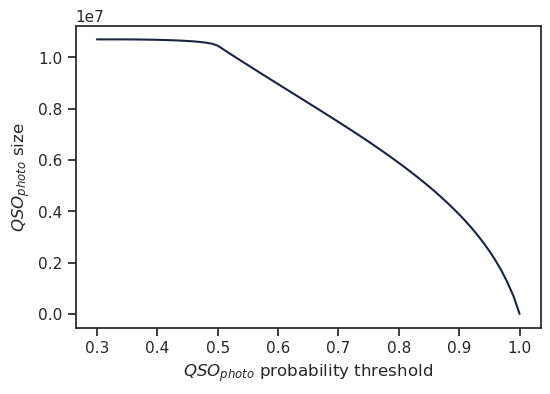

In [26]:
plot_proba_against_size(qso_kids_photo, column='QSO_PHOTO', x_lim=(0.3, 1))

# External catalogs

In [21]:
test_external_qso(catalog, plot=False, save=False)

catalog size: 45383661
--------------------
KiDS.DR4.x.6QZ.
ext. catalog x KiDS size: 17080
ext. catalog x KiDS catalog size: 16514, train elements: 2394
catalogs cross:
GALAXY - 90 (0.54%)
QSO - 16383 (99.21%)
STAR - 41 (0.25%)
catalogs cross, no train:
GALAXY - 74 (0.52%)
QSO - 14007 (99.20%)
STAR - 39 (0.28%)
--------------------
KiDS.DR4.x.QSO.Richards.2009.
ext. catalog x KiDS size: 33680
ext. catalog x KiDS catalog size: 31537, train elements: 6313
catalogs cross:
GALAXY - 1806 (5.73%)
QSO - 26904 (85.31%)
STAR - 2827 (8.96%)
catalogs cross, no train:
GALAXY - 1722 (6.83%)
QSO - 20829 (82.58%)
STAR - 2673 (10.60%)
--------------------
KiDS.DR4.x.QSO.Richards.2015.
ext. catalog x KiDS size: 38062
ext. catalog x KiDS catalog size: 35511, train elements: 7202
catalogs cross:
GALAXY - 1563 (4.40%)
QSO - 32871 (92.57%)
STAR - 1077 (3.03%)
catalogs cross, no train:
GALAXY - 1496 (5.28%)
QSO - 25778 (91.06%)
STAR - 1035 (3.66%)
--------------------
KiDS.DR4.x.QSO.GALEX.
ext. catalog x K

In [23]:
ext_catalog = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.6QZ.fits'))
ext_catalog = process_2df(ext_catalog)
ext_catalog = ext_catalog.loc[ext_catalog['id1'].isin(['GALAXY', 'QSO', 'STAR'])]
catalogs_cross = pd.merge(catalog, ext_catalog, on='ID', suffixes=('', '_right'))

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'date1' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'date2' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'edr_id' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'dr1_id' from integer to float
  """Entry point for launching an IPython kernel.


Multiclass classification results:
Accuracy = 0.9694
F1 per class = [0.2008 0.9821 0.9508]
Logloss = 0.2286


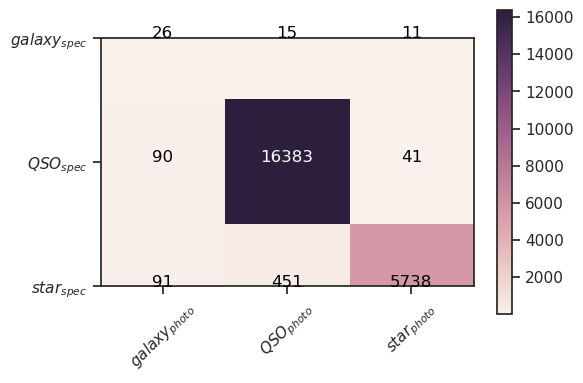

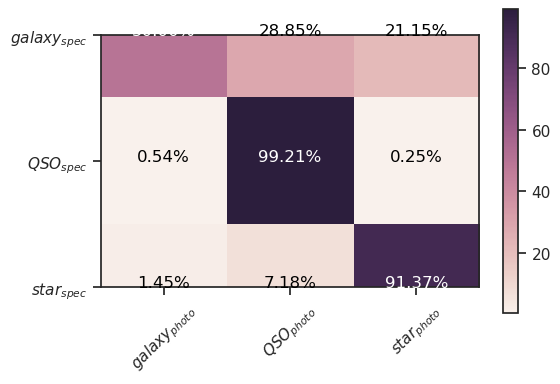

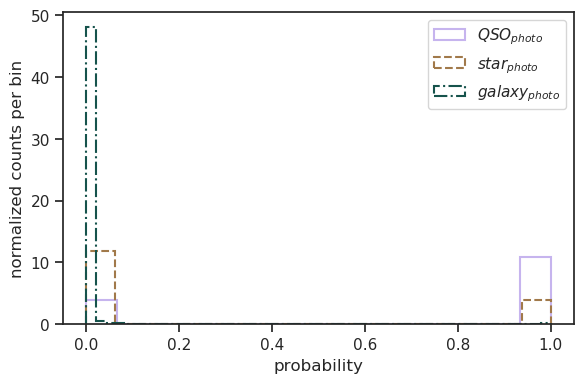

Binary classification results:
Predicted positives: 16849/22846 (73.75%)
Logloss = 0.1557
Accuracy = 0.9739
F1 = 0.9821
Precision = 0.9723
Recall = 0.9921
ROC AUC = 0.9698


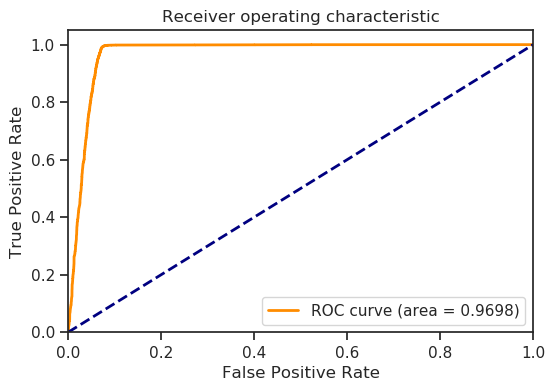

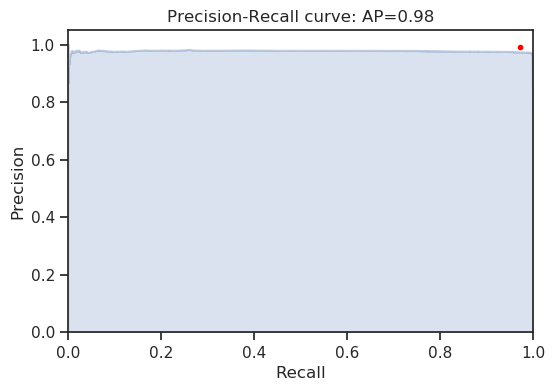

In [25]:
experiment_report(catalogs_cross, col_true='id1')

../plotting.py:302: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.xlabel('KiDS minimum photo probability')


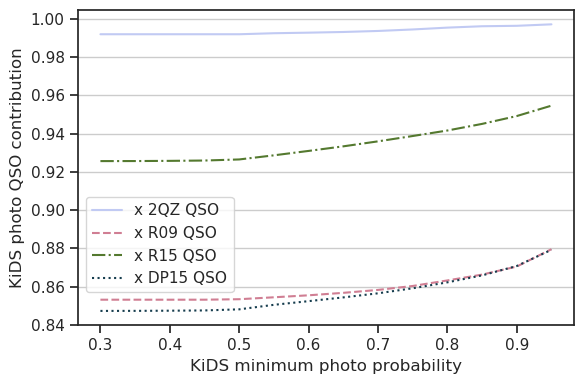

In [19]:
plot_external_qso_consistency(catalog)

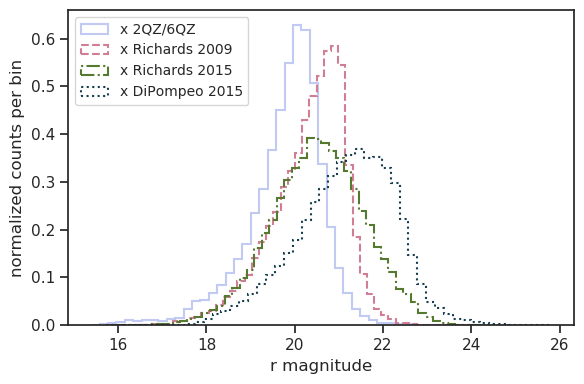

In [27]:
# TODO: take only QSOs from 6QZ and 0.7 min proba QSOs from Galex
data_dict = OrderedDict((data_name, read_fits_to_pandas(data_path, columns=columns).dropna(subset=['MAG_GAAP_r'])) for data_name, data_path, columns in EXTERNAL_QSO)
plot_histograms(data_dict, columns=['MAG_GAAP_r'], pretty_print_function=pretty_print_magnitude, legend_size=10)

# GAIA motion test

In [21]:
print(get_column_desc(catalog_x_gaia['CLASS_PHOTO']))

GALAXY - 108166 (3.53%)
QSO - 83239 (2.71%)
STAR - 2875483 (93.76%)


5 position shape: (2579970, 13)
Removing paralax_error shape: (2194287, 16)
Removing pmra_error shape: (1685262, 16)
Removing pmdec_error shape: (1629631, 16)
GALAXY - 1440 (0.09%)
QSO - 19197 (1.18%)
STAR - 1608994 (98.73%)
QSO:
          parallax        pmra       pmdec
mean   -0.00182881   0.0151897   -0.275476
median  -0.0136599 -0.00711411  0.00453636
sigma     0.649183     5.55765     8.06425
STAR:
        parallax      pmra    pmdec
mean    0.911782 -0.719197 -6.36944
median  0.615317  -1.18741 -4.49539
sigma     1.1847   15.6874  12.4151
GALAXY:
        parallax      pmra    pmdec
mean     0.40954  -1.12799 -4.56294
median  0.233325 -0.386579 -2.31344
sigma    1.99628   17.3097  13.8137


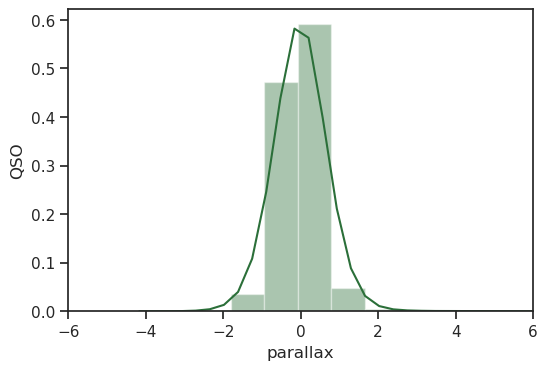

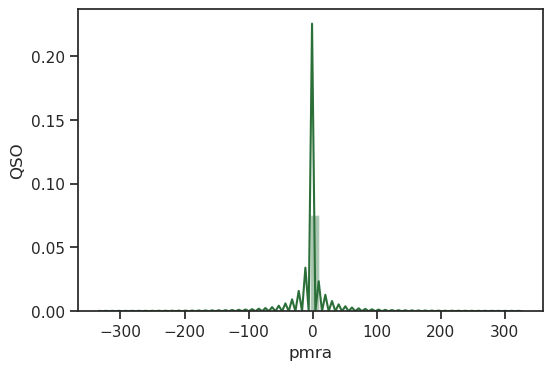

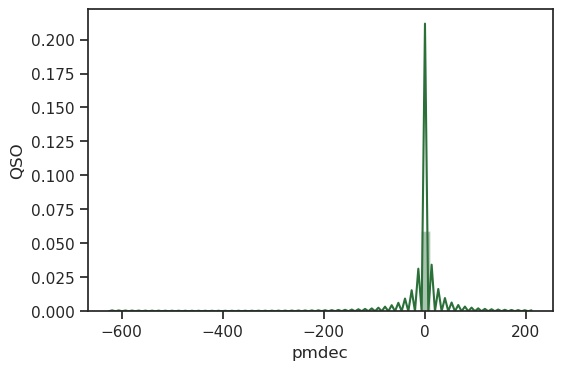

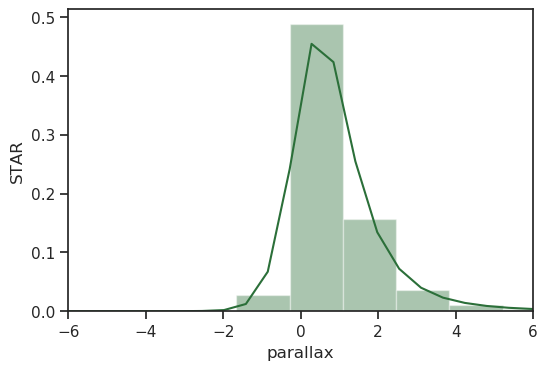

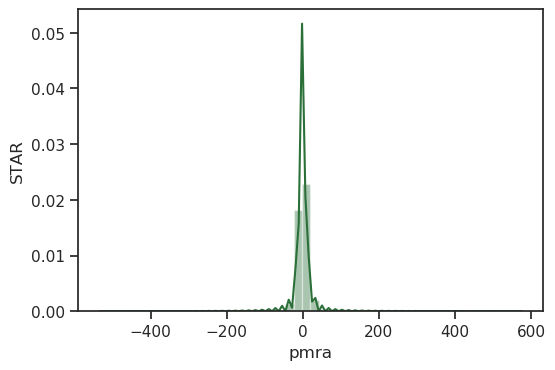

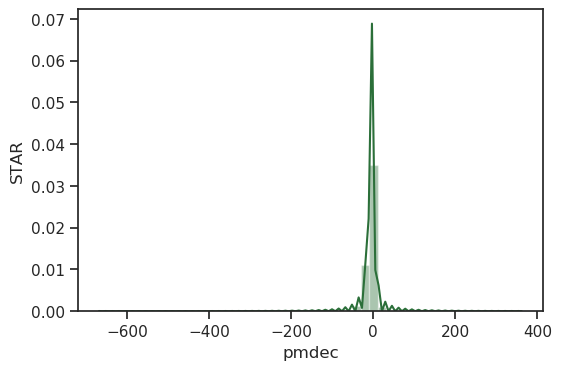

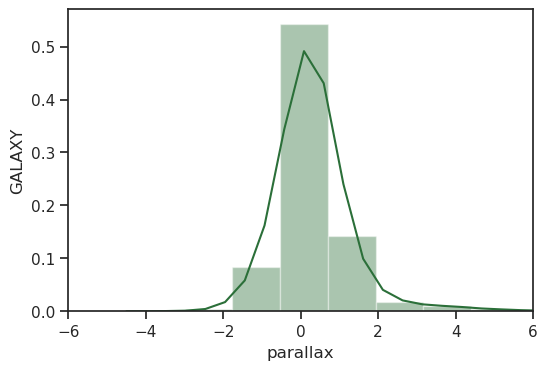

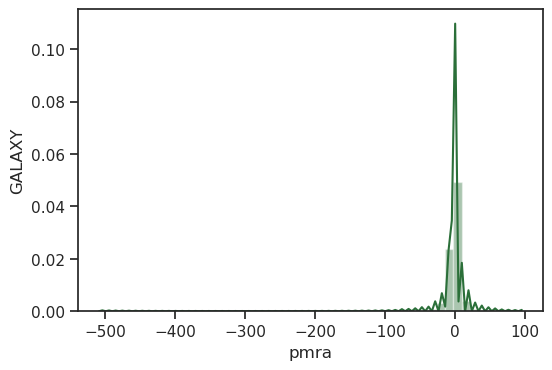

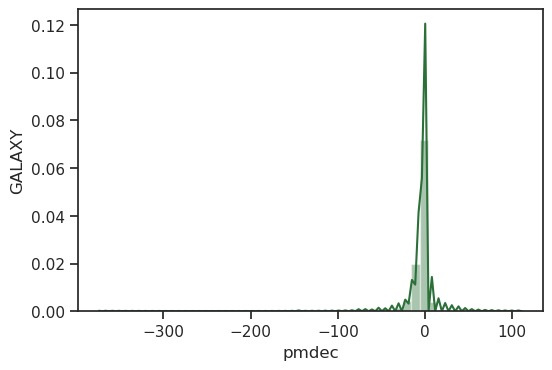

In [23]:
catalog_x_gaia_clean = process_gaia(catalog_x_gaia, parallax_error=1, pm_error=1)
print(get_column_desc(catalog_x_gaia_clean['CLASS_PHOTO']))
gaia_motion_analysis(catalog_x_gaia_clean)

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:268: RuntimeWarning: Mean of empty slice.
  loc = data.mean()
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:273: RuntimeWarning: Mean of empty slice.
  scale = np.sqrt(((data - loc)**2).mean())
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
../evaluation.py:605: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can 

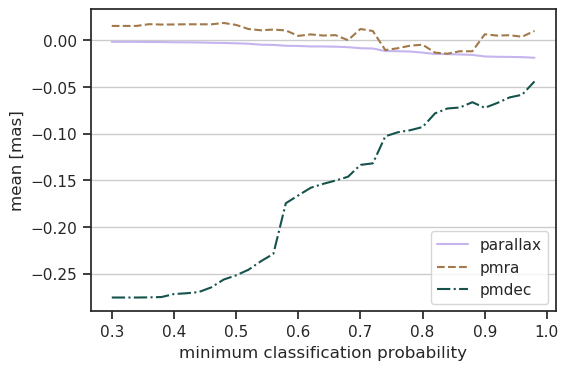

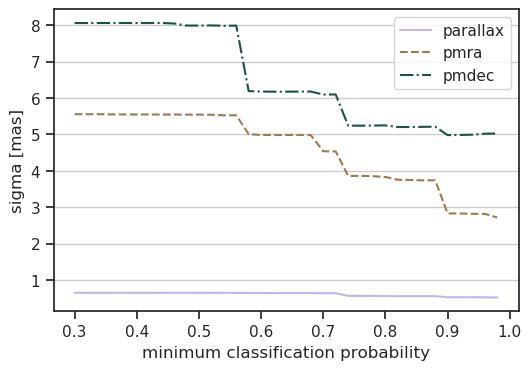

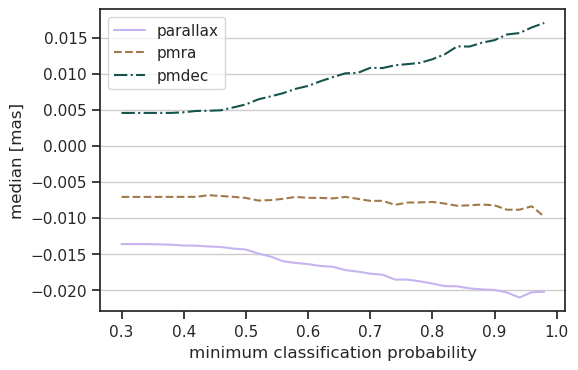

In [24]:
proba_motion_analysis(catalog_x_gaia_clean, motions=['parallax', 'pmra', 'pmdec'])

5 position shape: (2567158, 13)
Removing paralax_error shape: (2187911, 16)
Removing pmra_error shape: (1681902, 16)
Removing pmdec_error shape: (1626650, 16)
GALAXY - 833 (0.05%)
QSO - 18588 (1.14%)
STAR - 1607229 (98.81%)
QSO:
         parallax        pmra      pmdec
mean   -0.0133506 -0.00490209  -0.093017
median -0.0191301 -0.00781121  0.0119803
sigma    0.559857     3.83189    5.24991
STAR:
        parallax      pmra    pmdec
mean    0.912137 -0.721133 -6.37049
median   0.61557  -1.18898 -4.49599
sigma    1.18443   15.6817  12.4171
GALAXY:
        parallax      pmra    pmdec
mean    0.270137  -1.03553 -4.05342
median   0.18837 -0.414654 -2.08029
sigma    1.09754   10.3919  9.96614


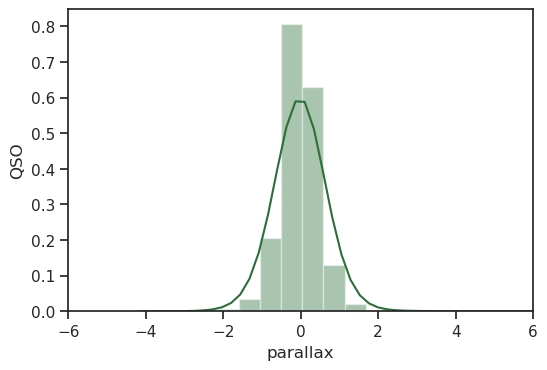

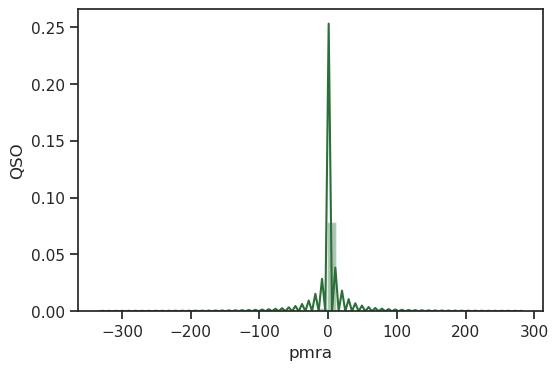

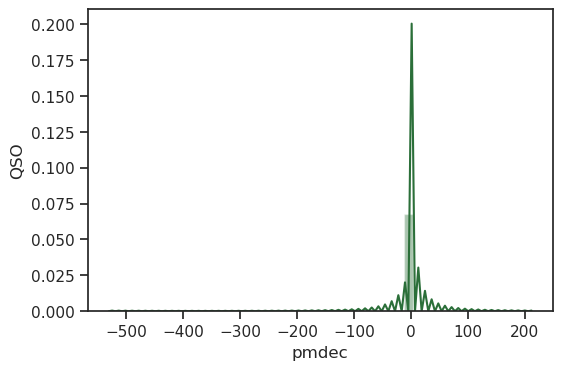

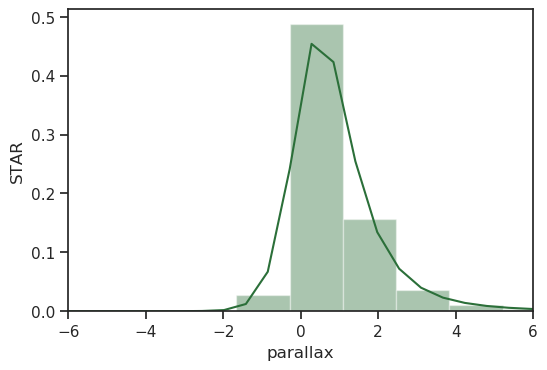

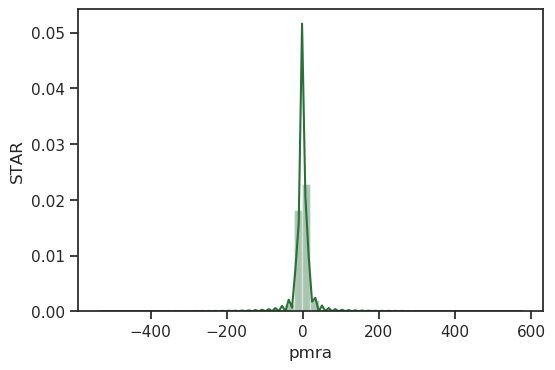

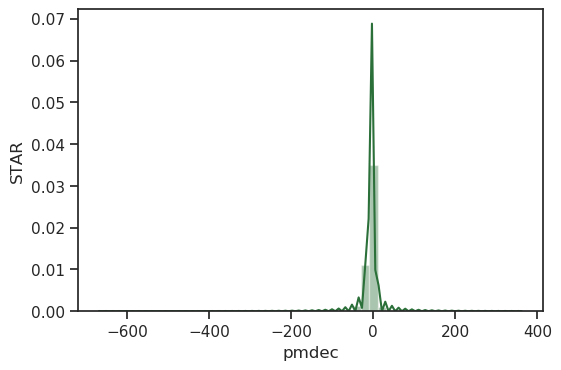

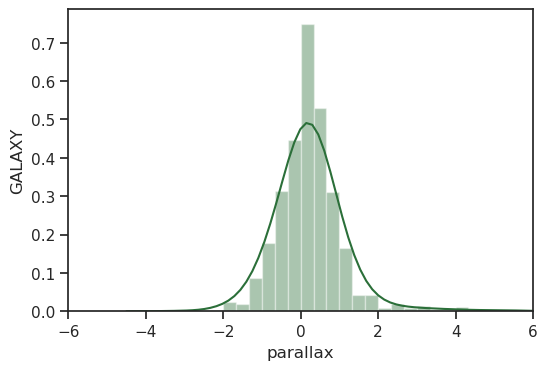

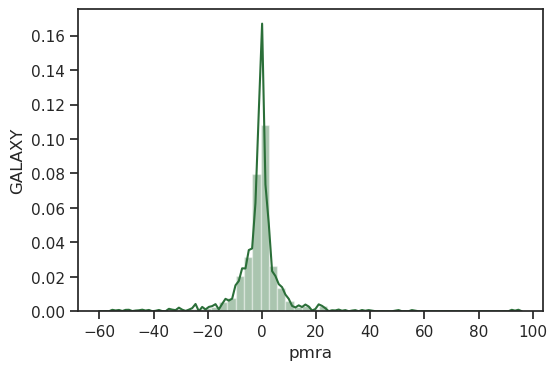

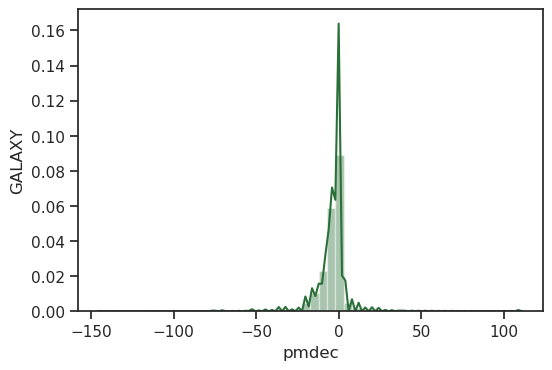

In [27]:
thr = 0.8
tmp = catalog_x_gaia.loc[catalog_x_gaia[['QSO_PHOTO', 'STAR_PHOTO', 'GALAXY_PHOTO']].max(axis=1) > thr]
tmp_clean = process_gaia(tmp, parallax_error=1, pm_error=1)
print(get_column_desc(tmp_clean['CLASS_PHOTO']))
gaia_motion_analysis(tmp_clean)

# Number counts

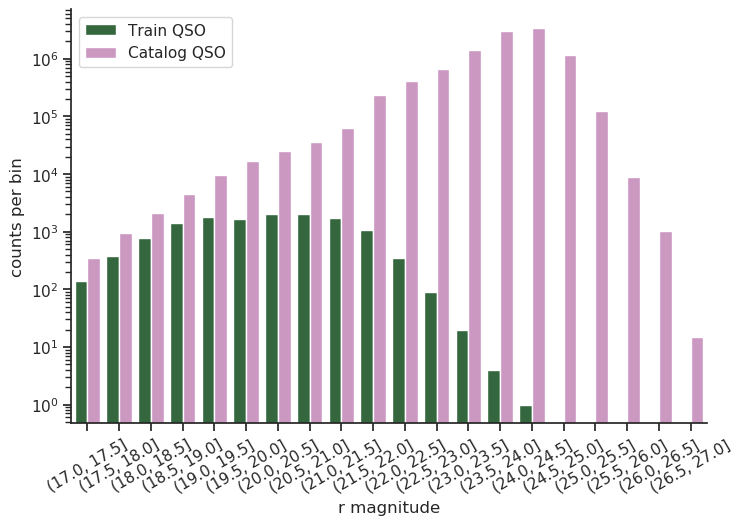

In [16]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Catalog QSO': qso_kids_photo,
}
number_counts_multidata(data_dict, x_lim=(17, 27), legend_loc='upper left')

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


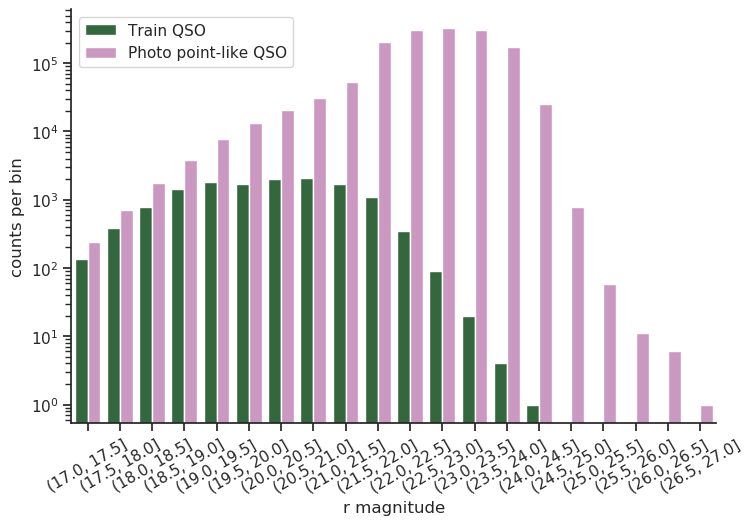

In [13]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Photo point-like QSO': catalog_point.loc[catalog['CLASS_PHOTO'] == 'QSO'],
}
number_counts_multidata(data_dict, x_lim=(17, 27), legend_loc='upper left')

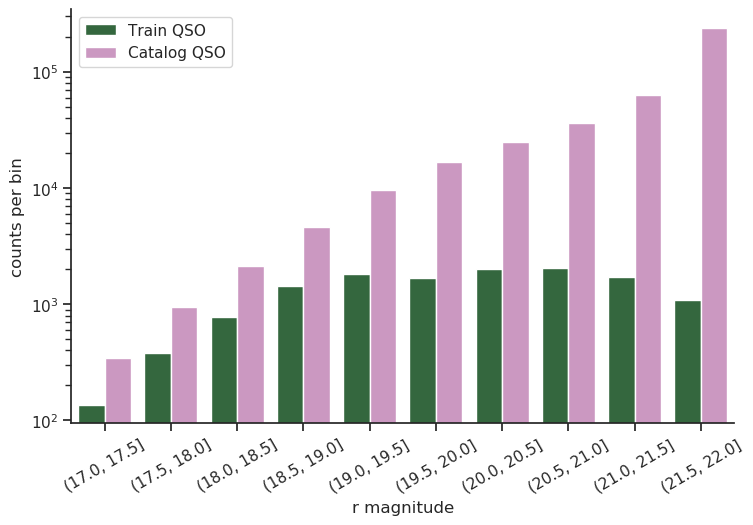

In [19]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Catalog QSO': qso_kids_photo,
#     'Catalog QSO, p(QSO) > 0.7': qso_kids_photo.loc[qso_kids_photo['QSO_PHOTO'] > 0.7],
#     'Catalog QSO, p(QSO) > 0.8': qso_kids_photo.loc[qso_kids_photo['QSO_PHOTO'] > 0.8],
}
number_counts_multidata(data_dict, x_lim=(17, 22), legend_loc='upper left')

# t-SNE visualization

In [ ]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

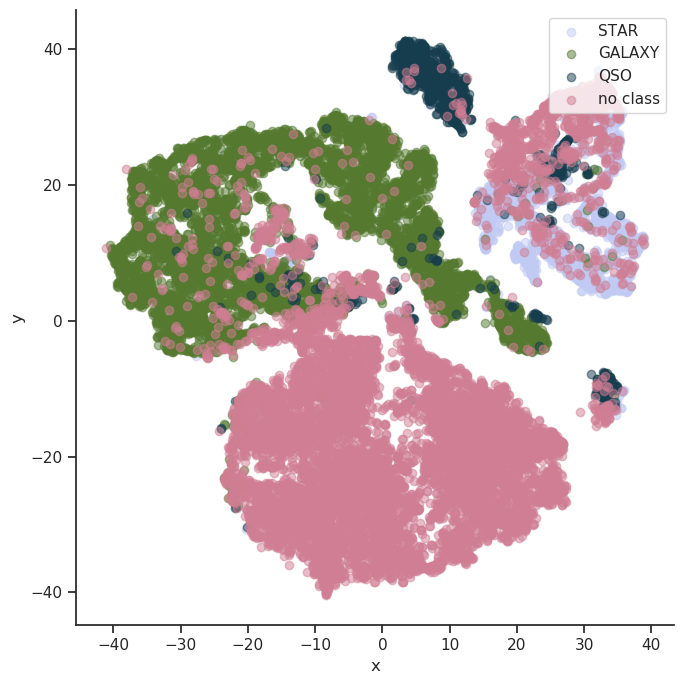

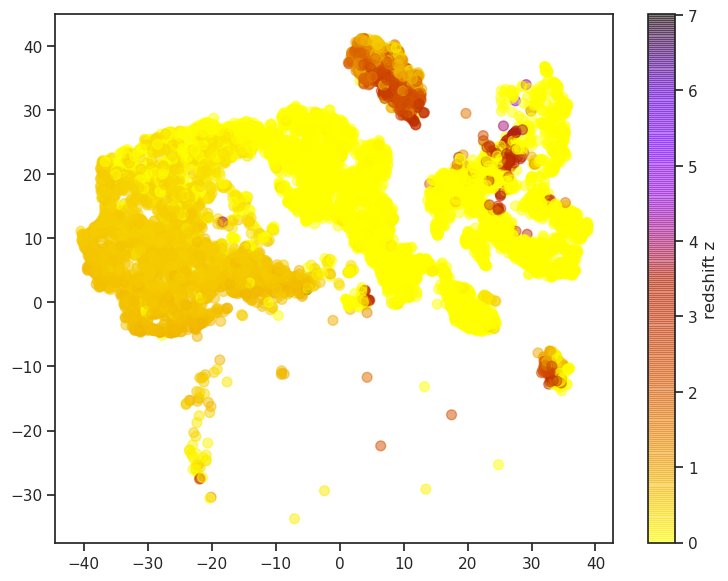

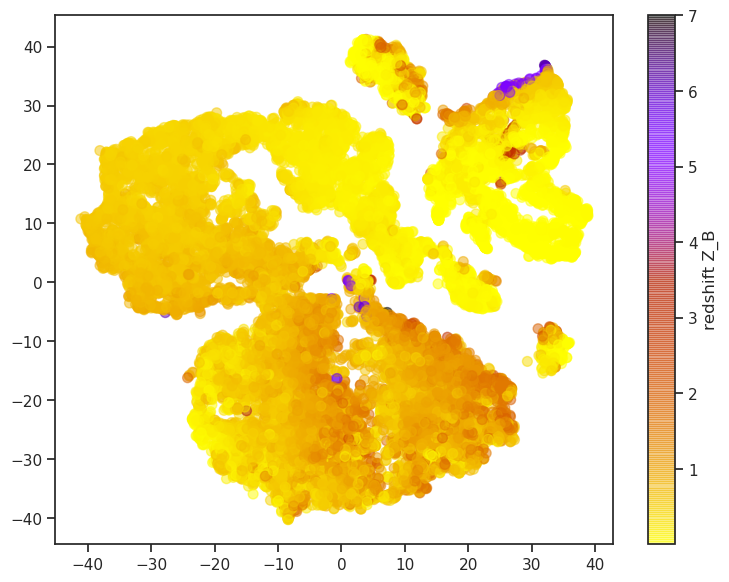

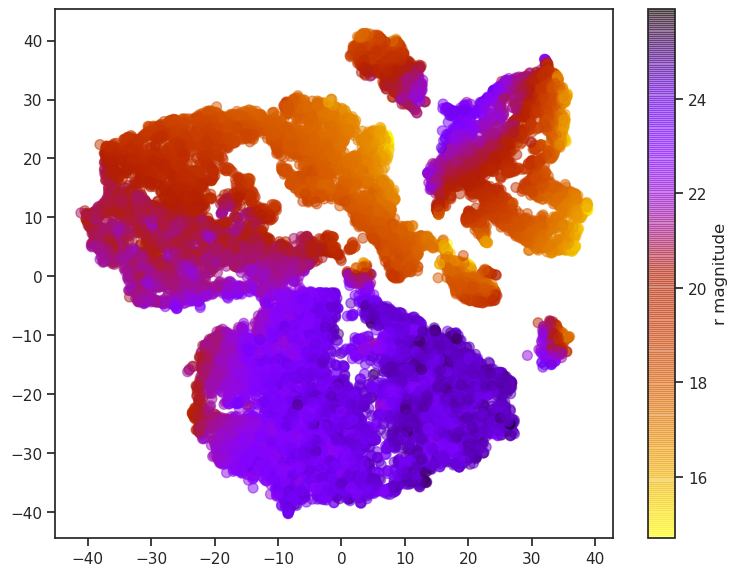

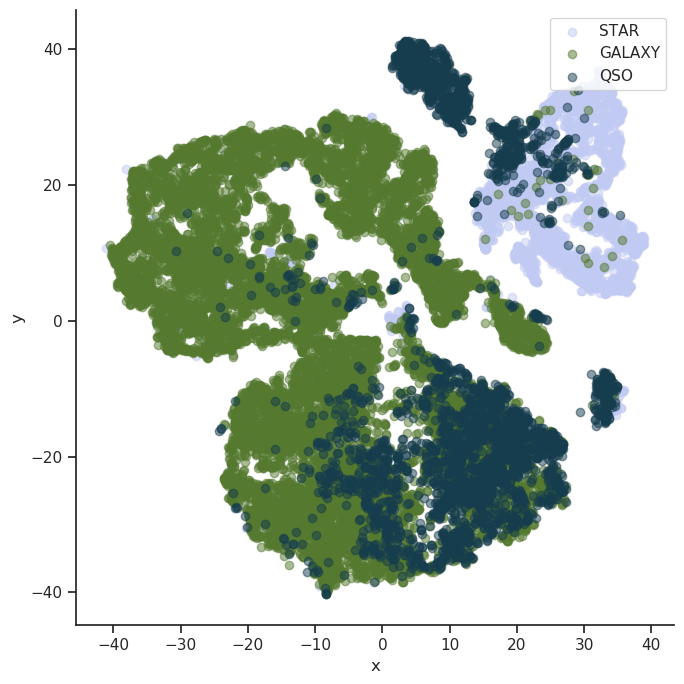

...

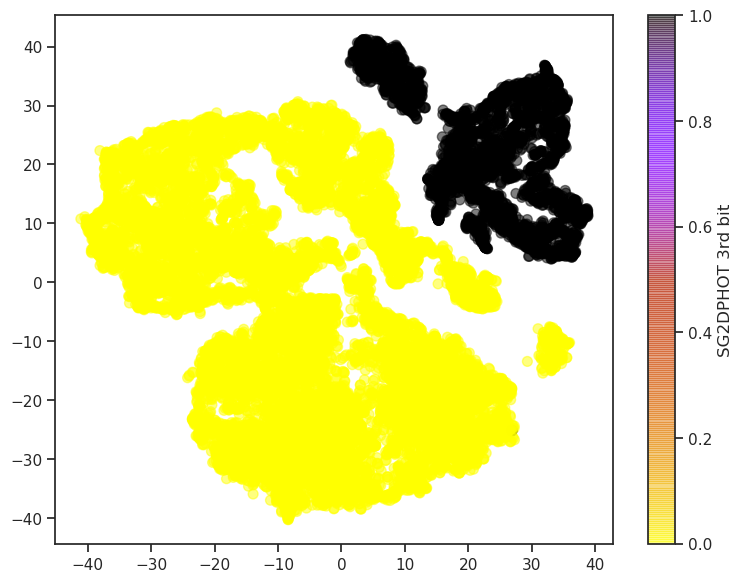

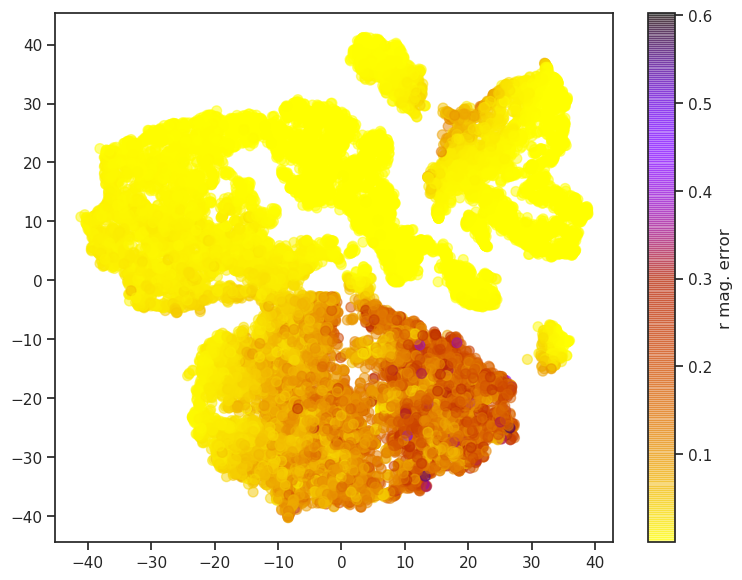

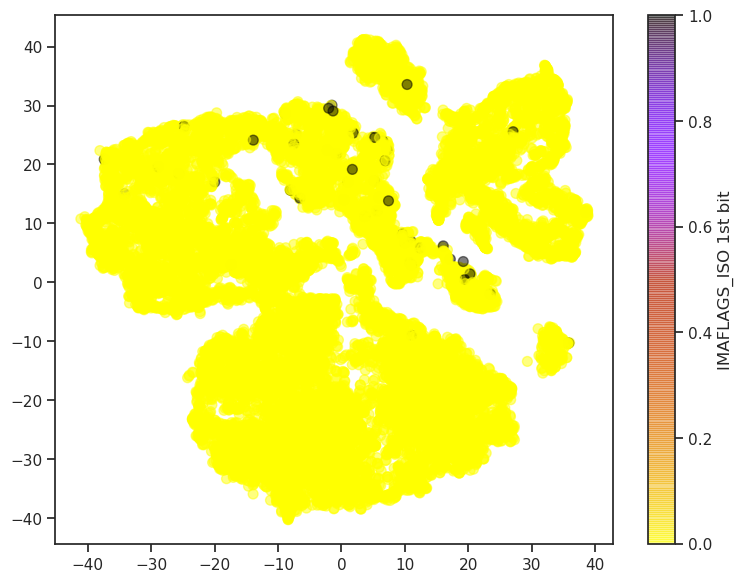

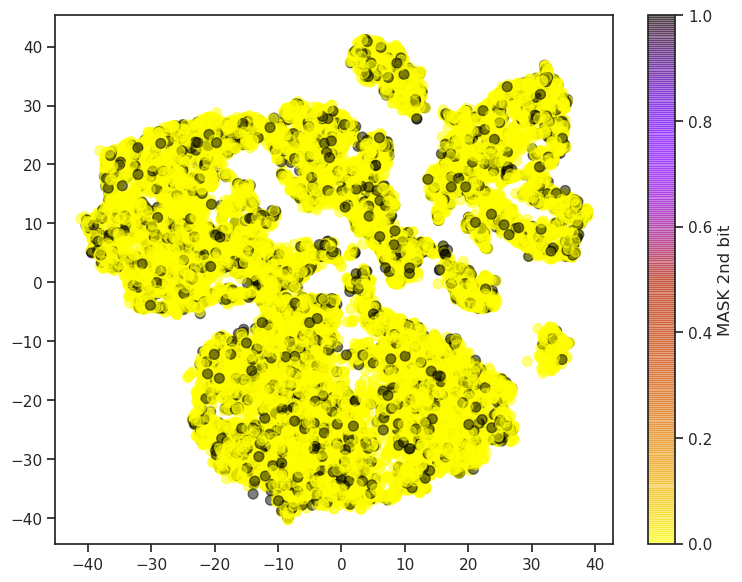

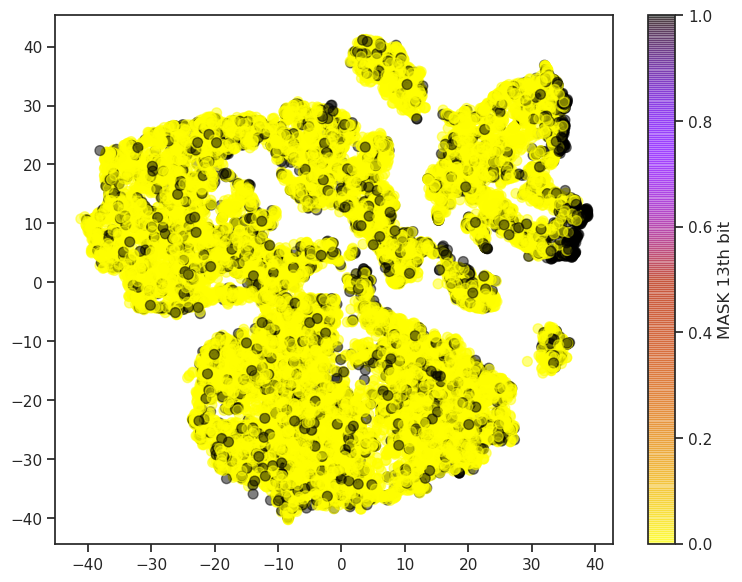

In [9]:
make_embedding_plots(kids_sdss_tsne)

In [ ]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_no-sg_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

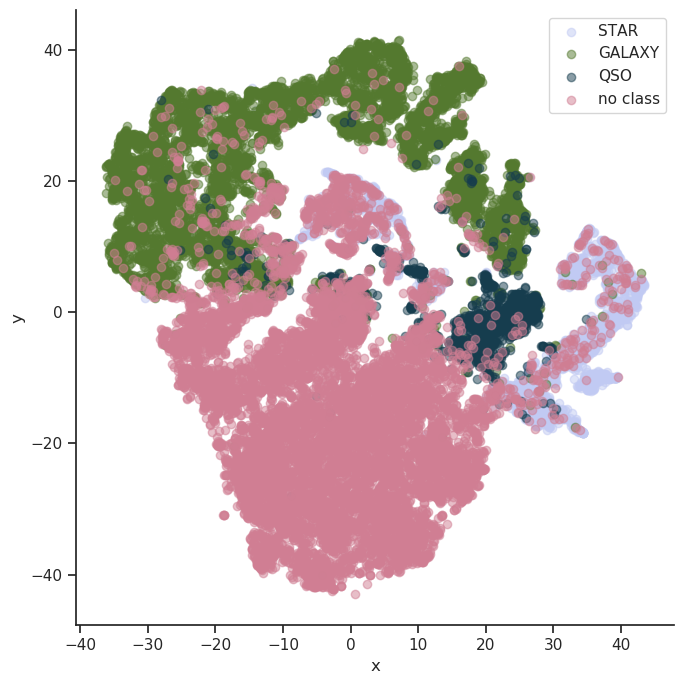

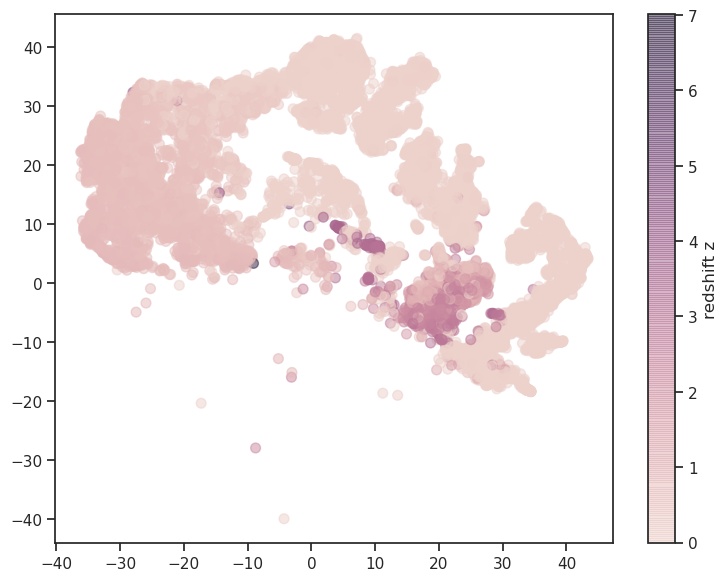

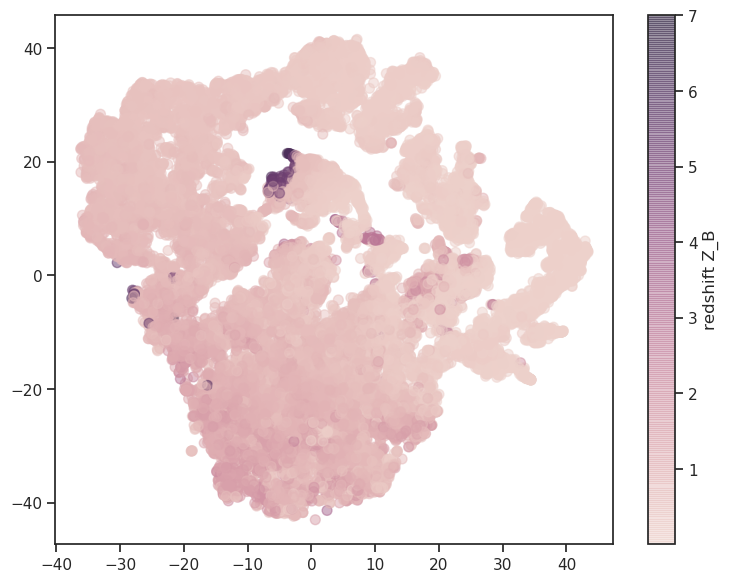

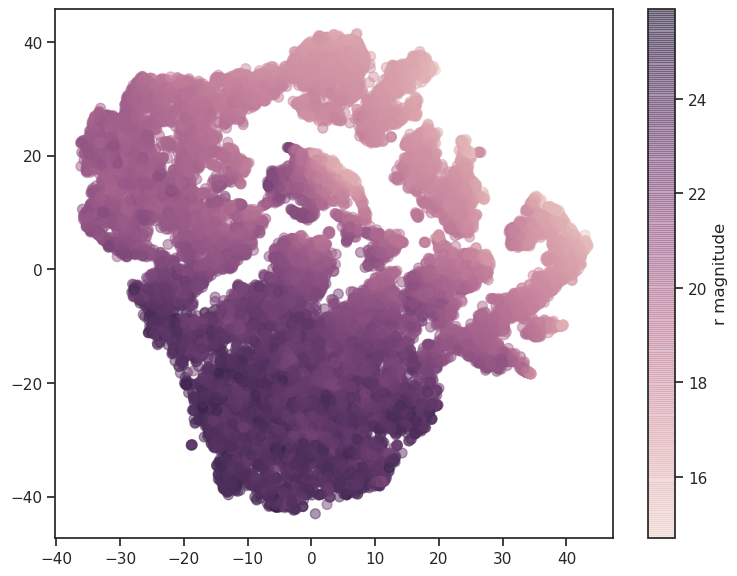

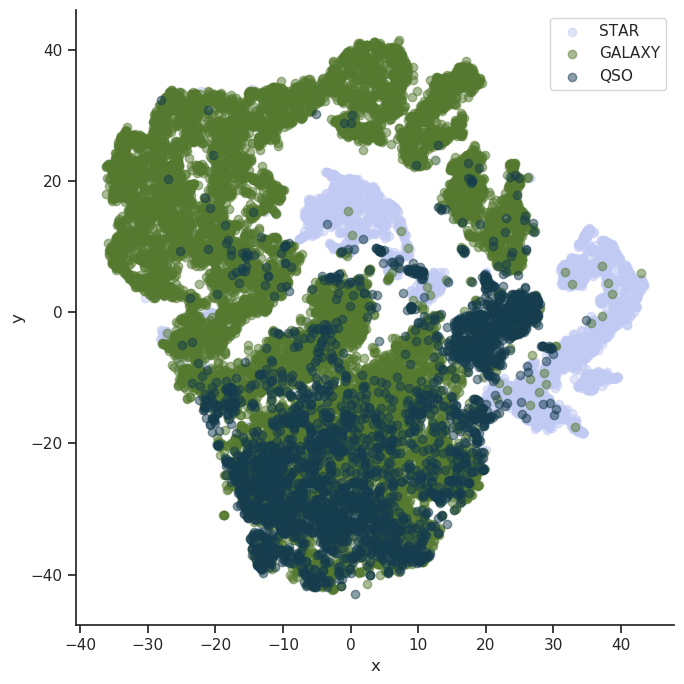

...

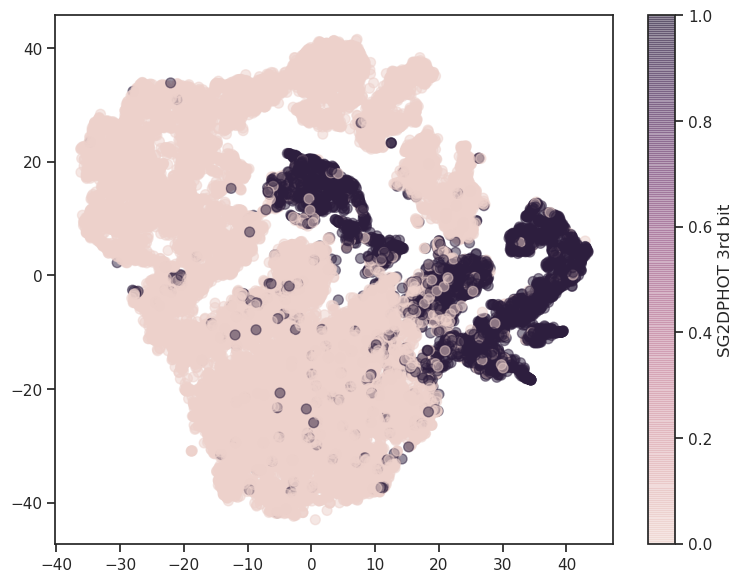

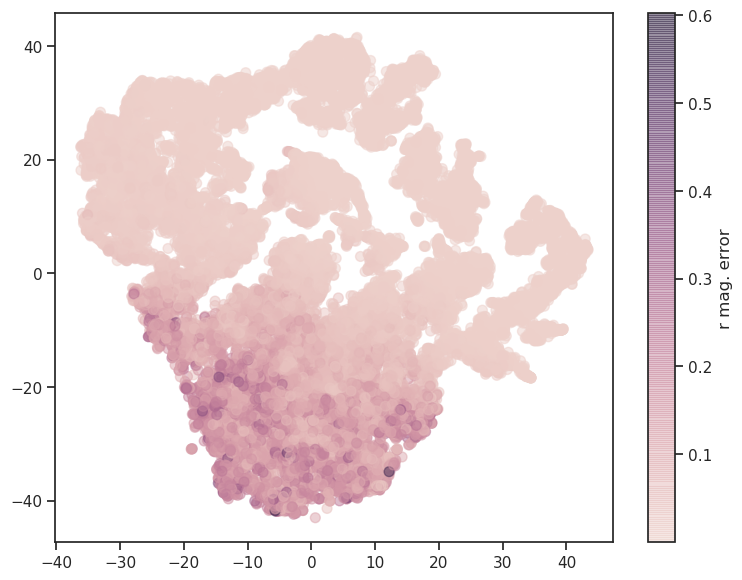

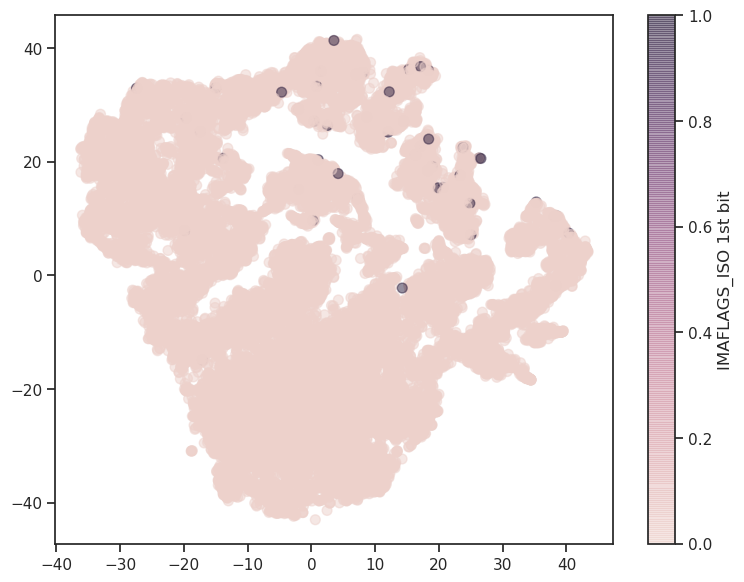

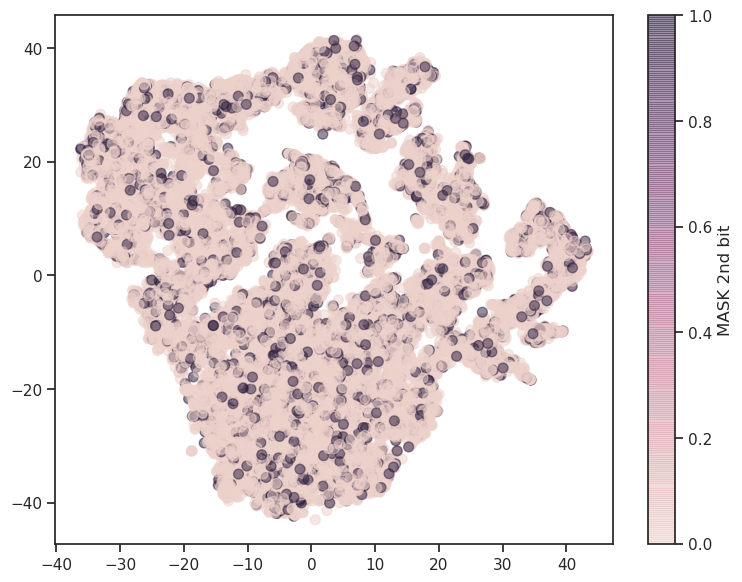

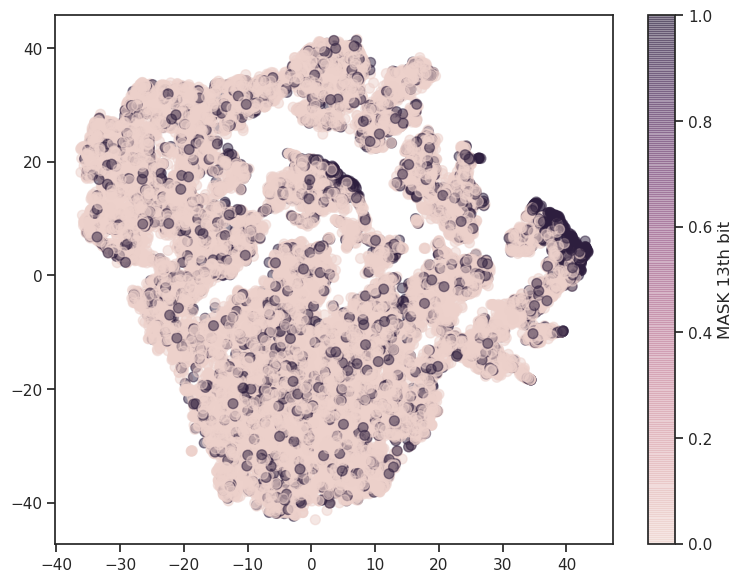

In [21]:
make_embedding_plots(kids_sdss_tsne)

In [ ]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_colors_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

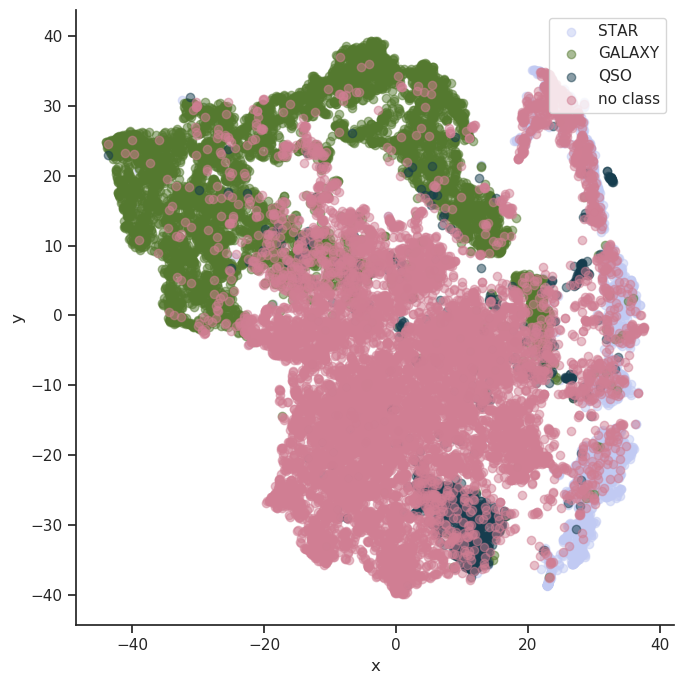

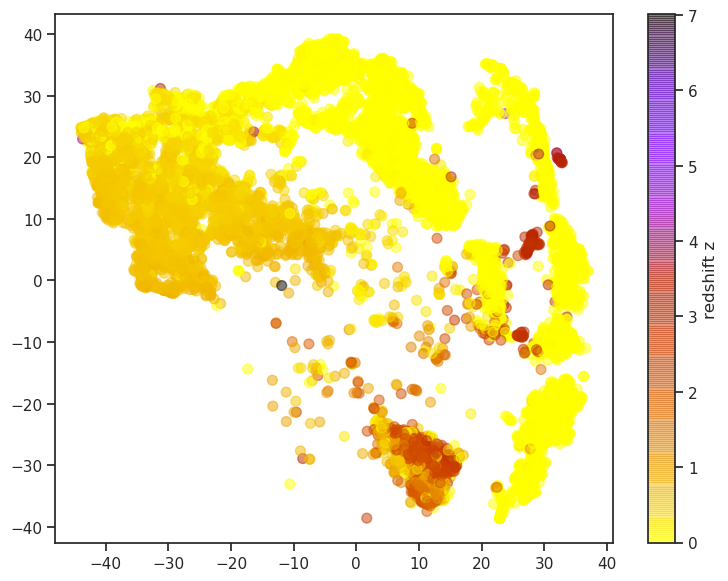

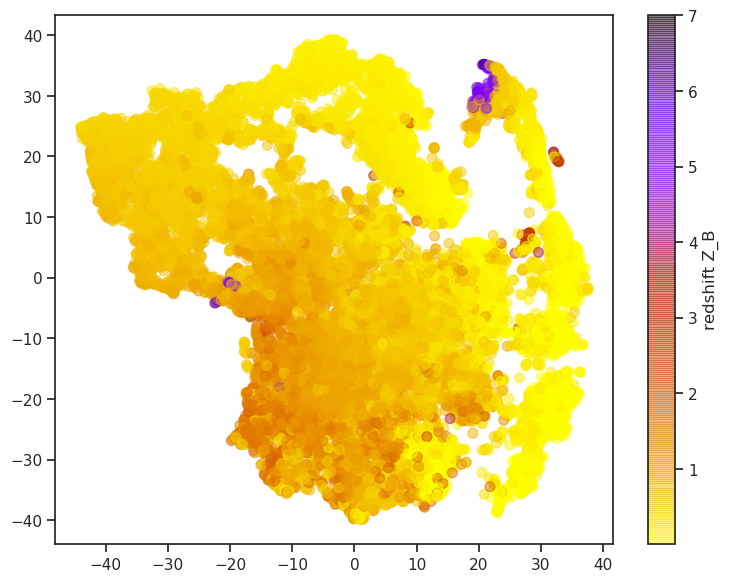

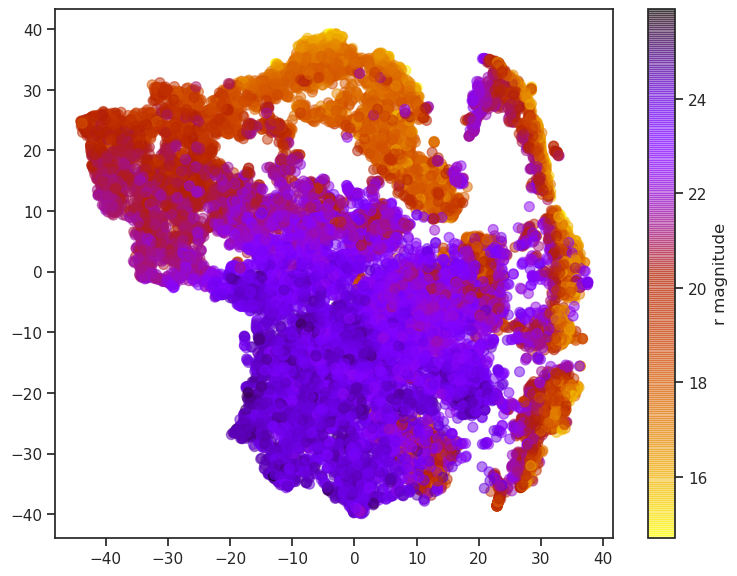

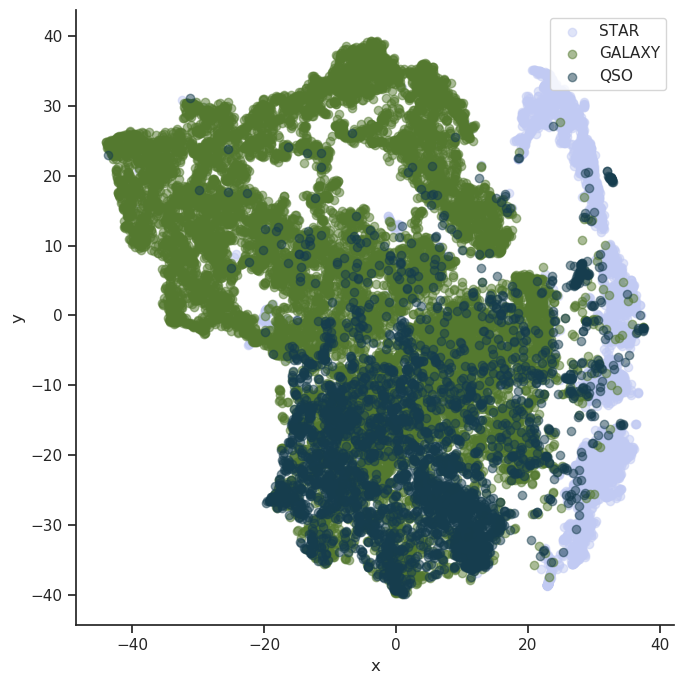

...

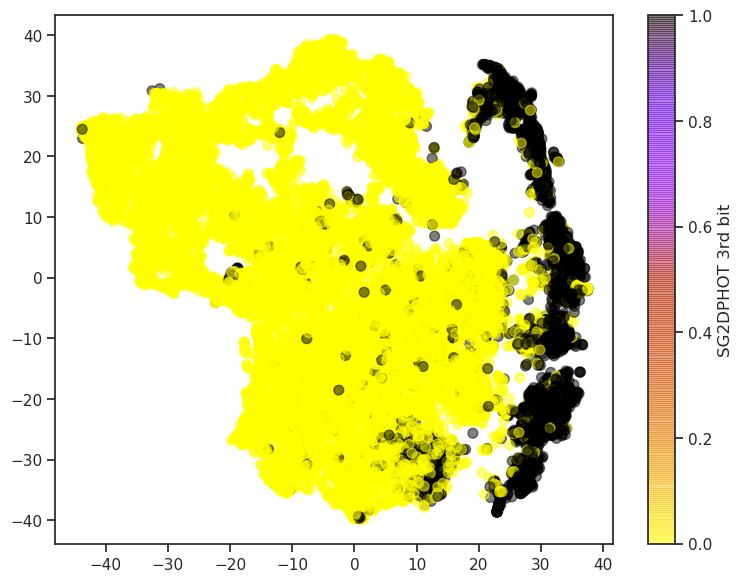

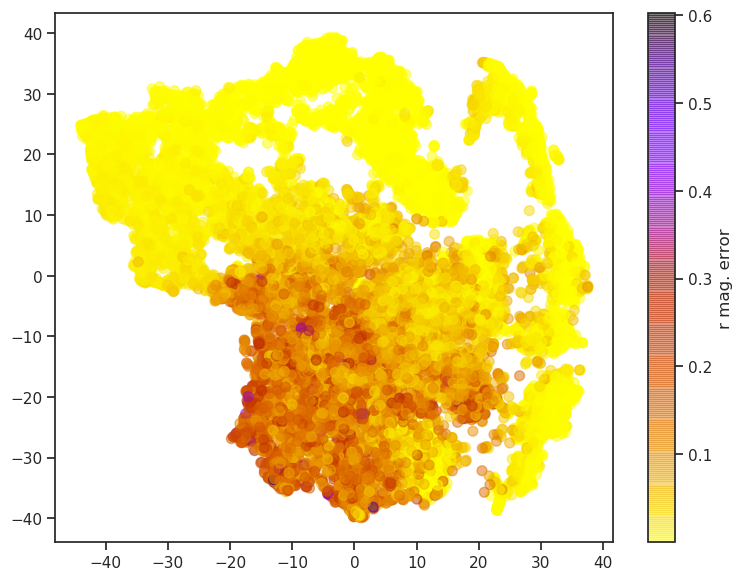

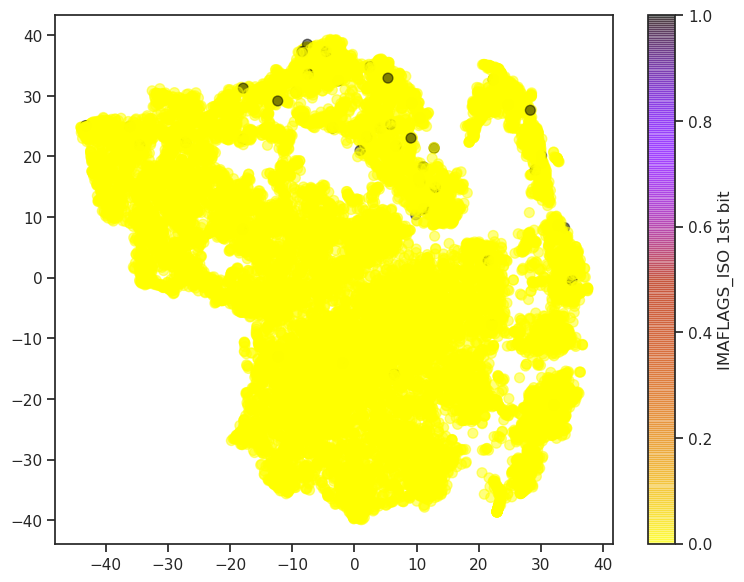

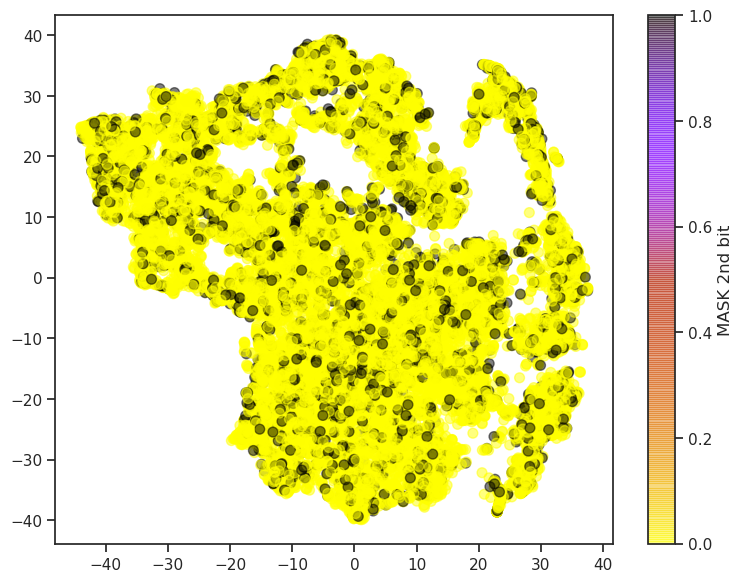

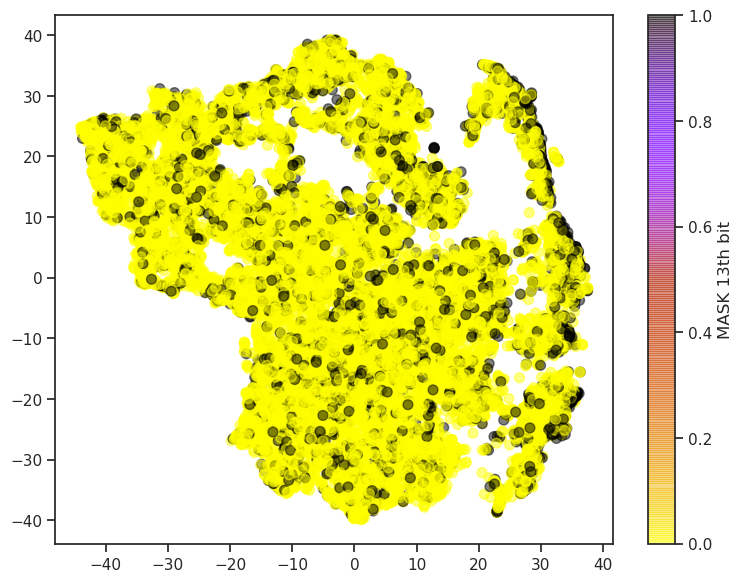

In [48]:
make_embedding_plots(kids_sdss_tsne)